In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mplt
import seaborn as sns
import arviz as az
import datetime

In [2]:
import fit_arima

In [3]:
import open_data
df_temp = open_data.open()
df = df_temp[0]

In [4]:
ritorno = fit_arima.compute(2, 1, catene=4, samples_per_chain=1250, burnin=1000)

16:11:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

16:28:28 - cmdstanpy - INFO - CmdStan done processing.
16:28:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: code_model_namespace::log_prob: phi[1][22] is 1, but must be less than or equal to 1.000000 (in '/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/Spatial/code.stan', line 101, column 2 to column 47)
	Exception: code_model_namespace::log_prob: H is not symmetric. H[1,2] = inf, but H[2,1] = inf (in '/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/Spatial/code.stan', line 91, column 2 to column 53)
	Exception: code_model_namespace::log_prob: H is not symmetric. H[1,2] = inf, but H[2,1] = inf (in '/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/Spatial/code.stan', line 91, column 2 to column 53)
Exception: code_model_namespace::log_prob: phi[2][1] is -nan, but must be greater than or equal to -1.000000 (in '/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/Spatial/code.stan', line 101, column 2 to column 47)

/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/Spatial/fit_arima.py:43: FutureWarning: Indexing with a float is deprecated, and will raise an IndexError in pandas 2.0. You can manually convert to an integer key instead.
  y_missing_list.append({'Stazione':df.columns[v[i]],'Data':df.index[u[i]],'Samples':inference_data.posterior.w.values[:,:,i].reshape(catene*samples_per_chain)})


Tempo di computazione: 17:19

In [5]:
res = az.loo(ritorno['inference_data'], var_name="log_lik", pointwise=True)
res

/home/br1/PythonProjects/PythonStats/.venv/lib/python3.10/site-packages/arviz/stats/stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


Computed from 5000 posterior samples and 17148 observations log-likelihood matrix.

         Estimate       SE
elpd_loo  7284.35   154.64
p_loo      301.52        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     17042   99.4%
 (0.5, 0.7]   (ok)          87    0.5%
   (0.7, 1]   (bad)         19    0.1%
   (1, Inf)   (very bad)     0    0.0%

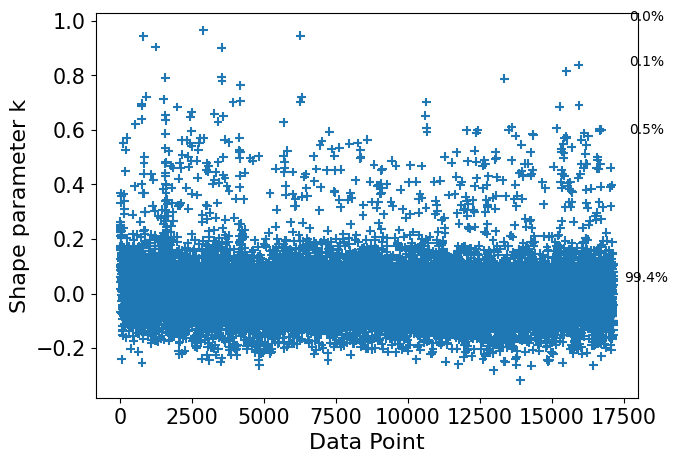

In [6]:
aux_plt = az.plot_khat(res, show_bins=True, figsize=(7,5))

In [7]:
res = az.waic(ritorno['inference_data'], var_name="log_lik")
res

/home/br1/PythonProjects/PythonStats/.venv/lib/python3.10/site-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 5000 posterior samples and 17148 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  7298.07   154.49
p_waic      287.80        -

There has been a warning during the calculation. Please check the results.

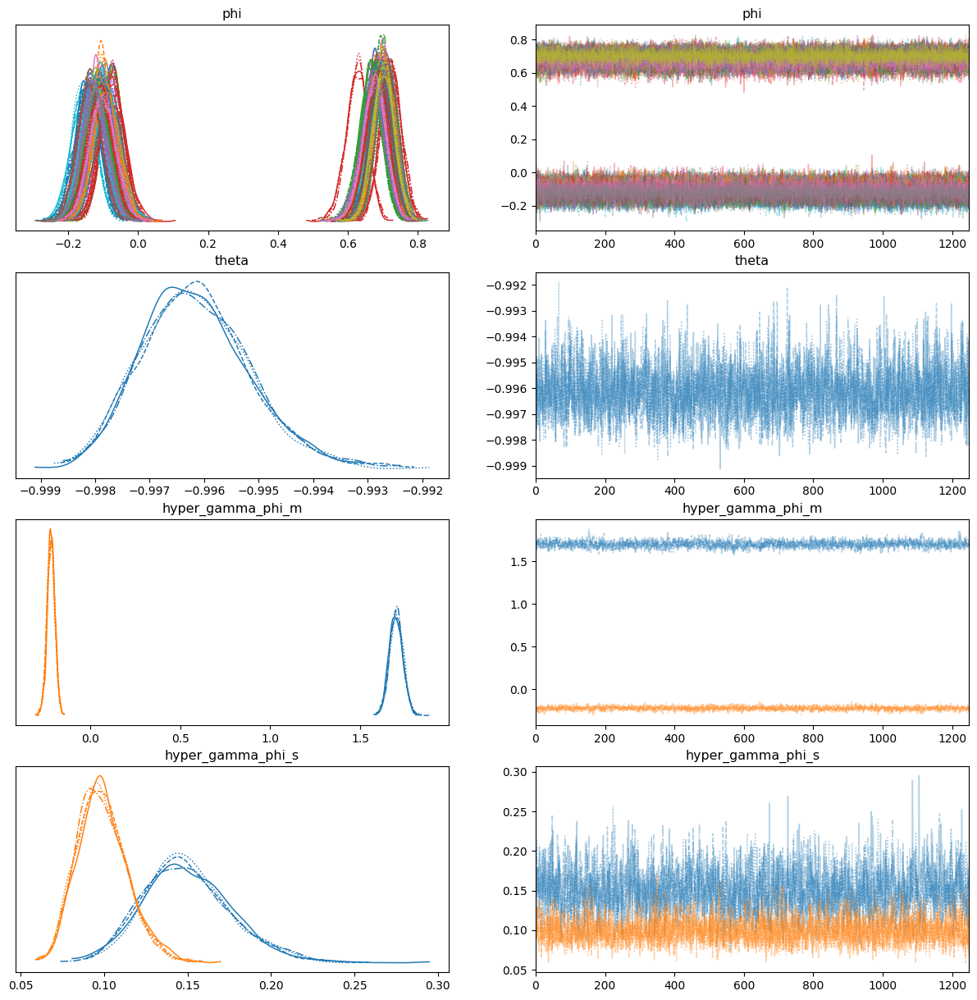

In [8]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['phi','theta','hyper_gamma_phi_m','hyper_gamma_phi_s'], divergences=True, figsize=(15,15))

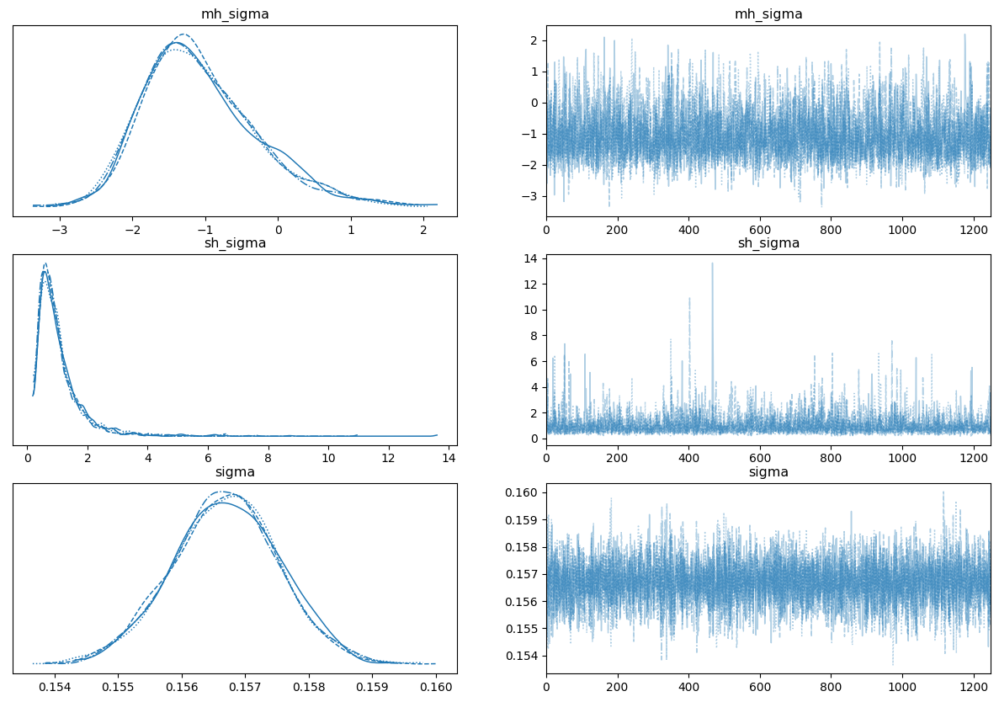

In [9]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['mh_sigma','sh_sigma','sigma'], divergences=True, figsize=(15,10))

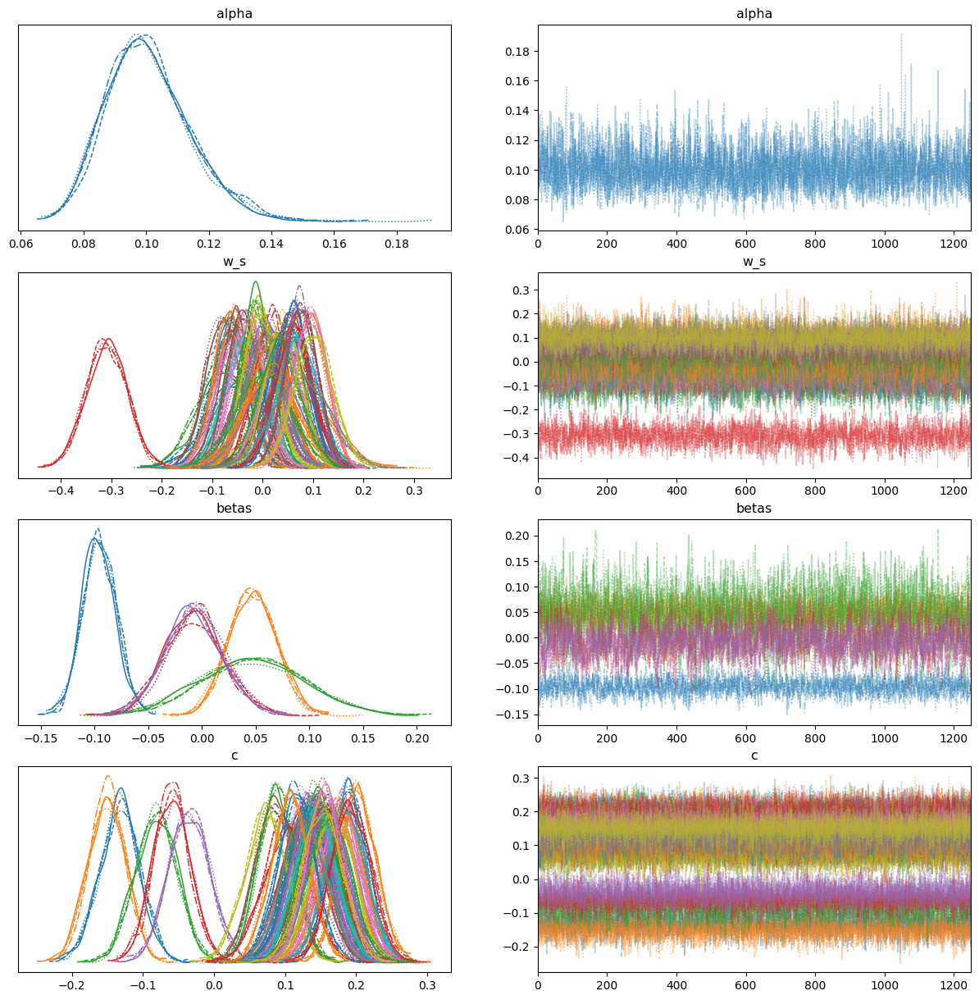

In [10]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['alpha','w_s','betas','c'], divergences=True, figsize=(15,15))

In [11]:
df_risultati = az.summary(ritorno['inference_data'], var_names=['betas'], hdi_prob=0.95)
df_risultati.loc[:,'Name'] = ['Altitude','Type_Suburban','Type_Rural','Zoning_2','Zoning_3'] #????????? Come sono state fatte le covariate?
df_risultati.set_index('Name', inplace=True)
df_risultati

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Name,,,,,,,,,
Altitude,-0.095,0.016,-0.126,-0.064,0.000,0.000,1733.0,2230.0,1.00
Type_Suburban,0.047,0.022,0.005,0.090,0.000,0.000,3730.0,3511.0,1.00
Type_Rural,0.047,0.049,-0.049,0.142,0.001,0.001,1971.0,2739.0,1.00
Zoning_2,-0.007,0.027,-0.061,0.047,0.001,0.001,442.0,1345.0,1.01
Zoning_3,-0.007,0.027,-0.060,0.046,0.001,0.001,477.0,1223.0,1.01


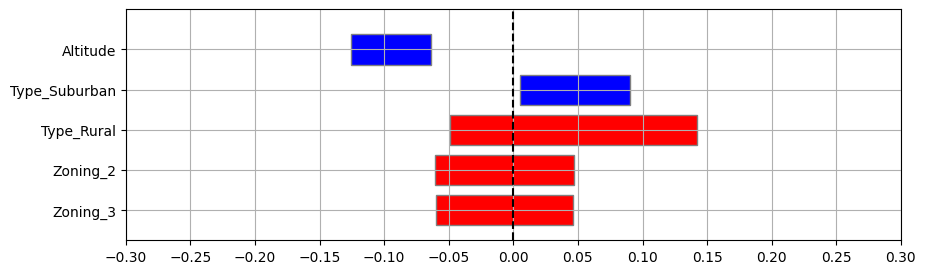

In [12]:
import time
from matplotlib.patches import Rectangle

plt.figure(figsize=(10,3))
ax = plt.subplot(1,1,1)
plt.xlim(left = -0.3, right = 0.3)
pos_rows = np.arange(0,len(df_risultati.index))
plt.ylim(bottom=-0.75, top=pos_rows[-1]+1.0)
i = 1
for row in df_risultati.index:    
    lci = df_risultati.loc[row, 'hdi_2.5%']
    rci = df_risultati.loc[row, 'hdi_97.5%']
    len_ci = rci - lci
    if lci*rci <= 0:
        col = 'red'
    else:
        col = 'blue'
    ax.add_patch(Rectangle((lci, pos_rows[-i] - 0.75/2), len_ci, 0.75,
             edgecolor = 'grey',
             facecolor = col,
             fill=True,
             lw=1))
    i += 1
    
    
plt.axvline(0, 0, pos_rows[-1]+0.75, linestyle='--', color='black')
plt.grid(axis='both')
plt.yticks(ticks=np.flip(pos_rows), labels=df_risultati.index.to_list())
plt.xticks(ticks=np.linspace(-0.3,0.3,13))
plt.show()

<AxesSubplot: ylabel='Density'>

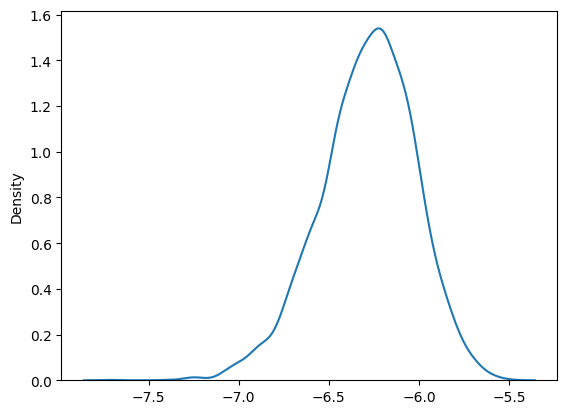

In [13]:
aux_shape = ritorno['inference_data'].posterior.gamma_th.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.gamma_th.values.reshape((aux_shape[0]*aux_shape[1])), legend=False)

<AxesSubplot: ylabel='Density'>

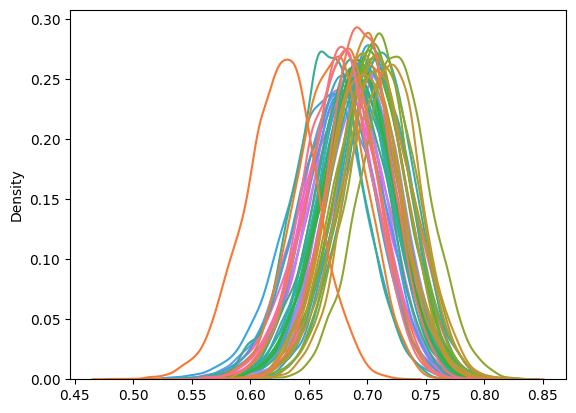

In [14]:
aux_shape = ritorno['inference_data'].posterior.phi.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.phi.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2],aux_shape[3]))[:,0,:], legend=False)

<AxesSubplot: ylabel='Density'>

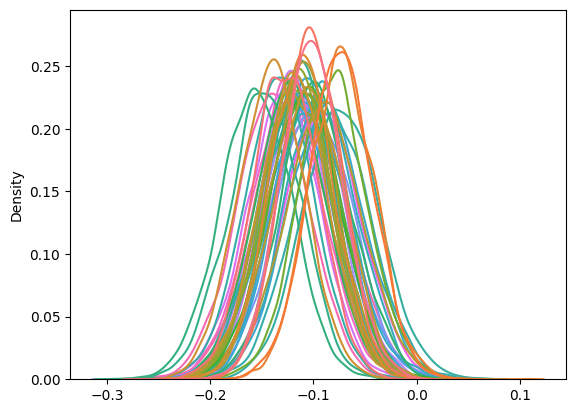

In [15]:
aux_shape = ritorno['inference_data'].posterior.phi.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.phi.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2],aux_shape[3]))[:,1,:], legend=False)

<AxesSubplot: ylabel='Density'>

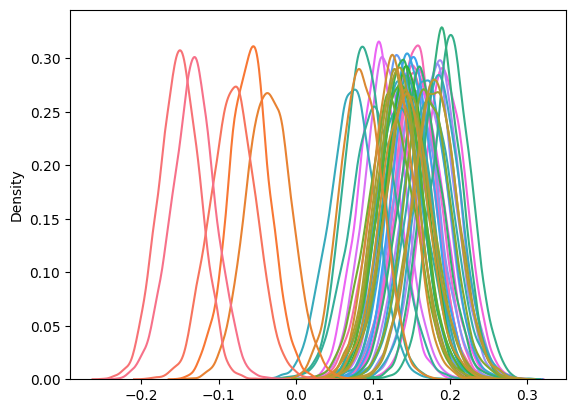

In [16]:
aux_shape = ritorno['inference_data'].posterior.c.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.c.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

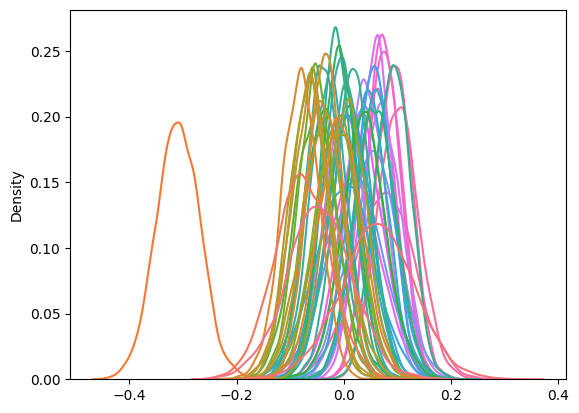

In [17]:
aux_shape = ritorno['inference_data'].posterior.w_s.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.w_s.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

In [18]:
pd.set_option('display.max_columns', 500)
spatial_results = pd.DataFrame(ritorno['inference_data'].posterior.w_s.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
spatial_results.loc['abs_dist_from_mean',:] = (spatial_results.loc['mean',:] - spatial_results.loc['mean',:].mean()).abs()
spatial_results.sort_values('abs_dist_from_mean', axis=1, ascending=False)
#spatial_results.sort_values('mean', axis=1, ascending=True)

,SAVIGNANO DI RIGO,TIMAVO,SAN FRANCESCO,PARCO EDILCARANI,VERUCCHIO,CORTE BRUGNATELLA,CITTADELLA,GERBIDO,MARECCHIA,MONTEBELLO,DE AMICIS,GIARDINI MARGHERITA,S. LAZZARO,FEBBIO,GIARDINI,SAN LAZZARO,S. ROCCO,SAN PIETRO CAPOFIUME,CASTELLARANO,PARCO FERRARI,SARAGAT,CENO,CASTELLUCCIO,PARCO RESISTENZA,PORTA SAN FELICE,PARCO MONTECUCCO,PARCO BERTOZZI,ROMA,BADIA,GIORDANI-FARNESE,LUGAGNANO,ZALAMELLA,REMESINA,FLAMINIA,FRANCHINI-ANGELONI,DELTA CERVIA,PARADIGNA,SAVIGNANO,GAVELLO,BESENZONE,MALCANTONE,GHERARDI,SAN LEO,CENTO,VILLA FULVIA,CAORLE,BOGOLESE,ISONZO,VIA CHIARINI
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,-0.309245,0.101037,0.093910,0.091430,-0.081113,-0.078087,0.076179,0.075876,-0.066842,0.074423,-0.063045,-0.062920,0.068277,0.062296,0.062132,-0.052557,0.059095,-0.050673,0.058332,0.056745,0.056024,0.054727,-0.045346,-0.037855,-0.037670,0.044395,-0.036300,-0.035025,-0.034593,0.041234,0.037797,-0.028955,0.036443,0.032708,-0.013891,-0.013565,0.021125,-0.011210,-0.008879,0.016331,0.014909,-0.006497,-0.006116,0.011714,0.009473,0.008522,0.000258,0.000696,0.004473
std,0.040726,0.039109,0.032664,0.032660,0.034804,0.051393,0.031619,0.056345,0.035723,0.030444,0.035026,0.036949,0.039194,0.069273,0.036818,0.039590,0.031425,0.035182,0.038330,0.037173,0.034147,0.047035,0.061748,0.038535,0.033689,0.037296,0.041892,0.039022,0.032218,0.034976,0.041020,0.035340,0.039081,0.041993,0.041678,0.031363,0.053700,0.040402,0.032017,0.034417,0.052966,0.033389,0.041451,0.040485,0.039925,0.036941,0.054151,0.039621,0.038417
min,-0.446592,-0.037678,-0.026089,-0.023930,-0.222950,-0.255500,-0.047075,-0.123854,-0.199621,-0.043122,-0.197628,-0.187991,-0.074851,-0.162870,-0.070606,-0.231311,-0.065280,-0.177565,-0.084557,-0.072015,-0.075055,-0.110849,-0.247876,-0.199018,-0.163654,-0.085616,-0.198926,-0.217088,-0.134710,-0.127359,-0.112527,-0.155905,-0.122237,-0.155945,-0.179319,-0.142520,-0.198286,-0.164061,-0.120312,-0.149322,-0.186717,-0.134072,-0.157714,-0.153221,-0.142570,-0.141561,-0.213735,-0.143557,-0.135129
25%,-0.336525,0.074655,0.070932,0.068719,-0.104889,-0.111712,0.054852,0.038359,-0.090927,0.054185,-0.086538,-0.087555,0.041883,0.018288,0.037888,-0.079301,0.037647,-0.074378,0.032579,0.031383,0.033391,0.024315,-0.085956,-0.063187,-0.060008,0.019730,-0.064078,-0.061765,-0.056374,0.017461,0.011217,-0.052206,0.010454,0.005136,-0.042326,-0.034219,-0.015157,-0.038290,-0.030714,-0.006486,-0.020543,-0.028592,-0.033681,-0.014505,-0.017417,-0.015258,-0.035613,-0.025186,-0.021287
50%,-0.309358,0.100988,0.094152,0.091768,-0.080514,-0.078079,0.076149,0.076869,-0.065880,0.074083,-0.062168,-0.062237,0.068405,0.062947,0.062468,-0.052486,0.059425,-0.051201,0.058449,0.057064,0.056186,0.055159,-0.045872,-0.038377,-0.037926,0.044675,-0.036021,-0.035471,-0.034718,0.040838,0.037882,-0.028205,0.036617,0.032672,-0.013824,-0.014048,0.021441,-0.010965,-0.009033,0.016350,0.015414,-0.006092,-0.006549,0.011862,0.009634,0.008112,0.001305,0.000632,0.004994
75%,-0.281365,0.126478,0.115954,0.114040,-0.057507,-0.042494,0.097956,0.113766,-0.042556,0.095036,-0.039499,-0.038185,0.095118,0.108768,0.086733,-0.026034,0.080425,-0.027131,0.083966,0.081034,0.078872,0.086227,-0.004999,-0.012312,-0.015181,0.069244,-0.009478,-0.008868,-0.013035,0.065638,0.064311,-0.005602,0.062554,0.060525,0.013900,0.007134,0.056901,0.015555,0.012736,0.038989,0.050631,0.015564,0.021116,0.039649,0.036200,0.033245,0.036252,0.027316,0.030323
max,-0.147294,0.240651,0.207450,0.205

<AxesSubplot: ylabel='Density'>

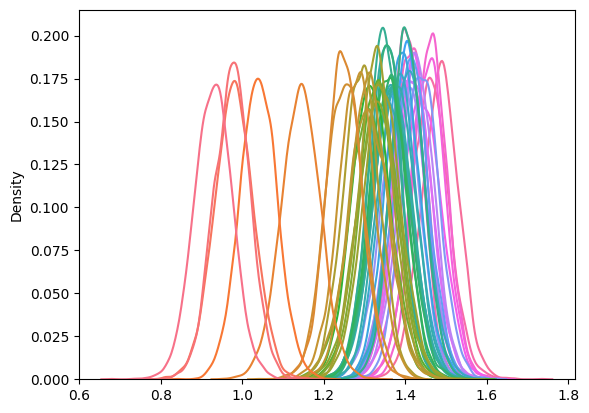

In [19]:
aux_shape = ritorno['inference_data'].posterior.annual_mean.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_mean.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

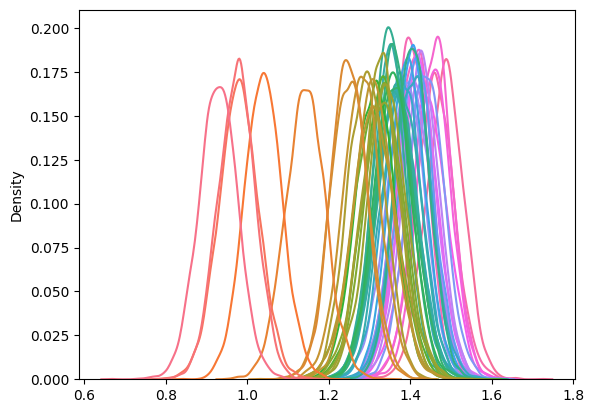

In [20]:
aux_shape = ritorno['inference_data'].posterior.annual_median.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_median.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

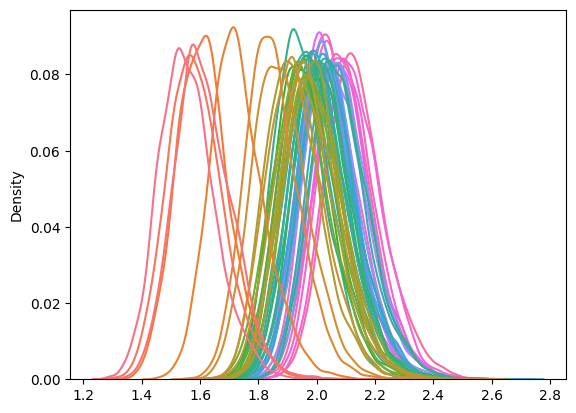

In [21]:
aux_shape = ritorno['inference_data'].posterior.annual_max.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_max.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

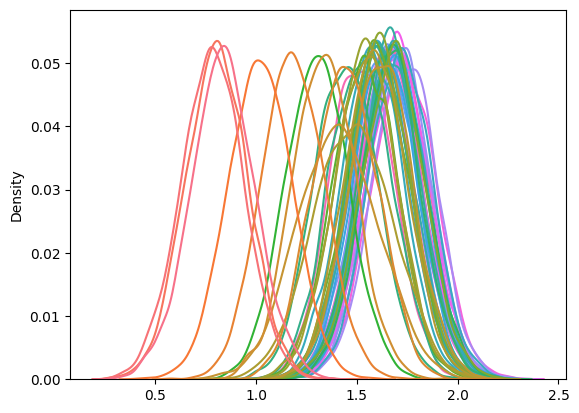

In [22]:
valori_31_dic = []
for dizionario in ritorno['missing']:
    if dizionario['Data'] == '2018-12-31':
        valori_31_dic.append(dizionario['Samples'])
        
res_plot = sns.kdeplot(valori_31_dic, legend=False)

<AxesSubplot: ylabel='Density'>

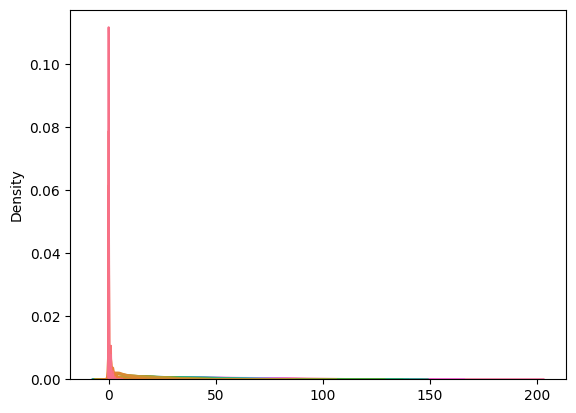

In [23]:
aux_shape = ritorno['inference_data'].posterior.annual_days_over_threshold.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_days_over_threshold.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

In [24]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.annual_days_over_threshold.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,CASTELLUCCIO,CORTE BRUGNATELLA,SAVIGNANO DI RIGO,FEBBIO,SAN LEO,VERUCCHIO,BADIA,MARECCHIA,GIARDINI MARGHERITA,SAN PIETRO CAPOFIUME,LUGAGNANO,DELTA CERVIA,PARCO BERTOZZI,SAN LAZZARO,PARCO RESISTENZA,GHERARDI,FRANCHINI-ANGELONI,VIA CHIARINI,DE AMICIS,BESENZONE,GAVELLO,PORTA SAN FELICE,SAVIGNANO,CAORLE,VILLA FULVIA,ROMA,PARCO MONTECUCCO,CASTELLARANO,CENTO,BOGOLESE,ZALAMELLA,SAN FRANCESCO,MALCANTONE,REMESINA,SARAGAT,PARADIGNA,S. ROCCO,S. LAZZARO,CITTADELLA,PARCO FERRARI,ISONZO,PARCO EDILCARANI,GIORDANI-FARNESE,CENO,FLAMINIA,GERBIDO,MONTEBELLO,GIARDINI,TIMAVO
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000
mean,0.095600,0.163400,0.225600,0.255400,1.439600,6.197000,8.20980,13.162000,13.178800,17.152400,17.442800,17.644800,18.430200,19.990600,20.627600,21.819000,22.125200,22.148200,23.223400,23.629400,24.239400,24.256000,24.404200,28.09920,28.303800,29.045200,29.43020,29.575400,31.441200,32.736200,34.321600,35.964000,36.774000,37.059400,37.371400,37.512800,37.699400,37.831200,40.001800,42.807000,43.252200,44.052200,46.156000,49.497600,50.792000,53.916800,56.41760,59.524000,66.759200
std,0.365633,0.495933,0.601313,0.608806,1.851982,4.431131,5.71387,7.497186,7.620633,10.164892,9.594245,8.835307,10.522437,10.510614,10.528812,11.961674,11.615322,11.130958,10.642826,12.402113,11.415347,10.608854,11.669638,13.22449,12.937642,13.135237,12.91147,12.042779,13.770362,13.767241,14.371621,13.037174,15.161692,14.608373,14.217042,14.845562,15.382482,15.050103,14.305926,15.784181,16.212142,14.623127,16.244114,17.326397,18.697151,19.020563,17.39276,18.115316,20.318184
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.00000,0.000000,0.000000,2.00000,4.000000,0.000000,2.000000,3.000000,4.000000,3.000000,2.000000,3.000000,4.000000,1.000000,1.000000,3.000000,7.000000,4.000000,5.000000,4.000000,5.000000,4.000000,5.000000,8.00000,10.000000,15.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,4.00000,8.000000,8.000000,10.000000,11.000000,11.000000,11.000000,12.000000,13.000000,13.000000,14.000000,14.000000,16.000000,15.000000,16.000000,17.000000,16.000000,18.00000,19.000000,20.000000,20.00000,21.000000,21.000000,23.000000,24.000000,27.000000,26.000000,26.000000,27.000000,27.000000,27.000000,27.000000,30.000000,31.000000,32.000000,34.000000,34.000000,37.000000,37.000000,40.000000,44.00000,47.000000,53.000000
50%,0.000000,0.000000,0.000000,0.000000,1.000000,5.000000,7.00000,12.000000,12.000000,15.000000,16.000000,16.000000,17.000000,18.000000,19.000000,20.000000,20.000000,20.000000,22.000000,22.000000,22.000000,23.000000,23.000000,26.00000,27.000000,27.000000,28.00000,28.000000,30.000000,31.000000,33.000000,35.000000,35.000000,36.000000,36.000000,36.000000,36.000000,36.000000,39.000000,41.000000,42.000000,43.000000,45.000000,48.000000,49.000000,52.000000,55.00000,58.000000,66.000000
75%,0.000000,0.000000,0.000000,0.000000,2.000000,9.000000,11.00000,17.000000,17.000000,22.000000,23.000000,22.250000,24.000000,26.000000,26.000000,28.000000,28.000000,28.000000,30.000000,30.000000,31.000000,30.000000,31.000000,36.00000,36.000000,36.000000,37.00000,37.000000,40.000000,40.000000,43.000000,44.000000,45.000000,46.000000,46.000000,46.000000,47.000000,47.000000,49.000000,52.000000,53.000000,53.000000,56.000000,60.000000,62.000000,65.000000,68.00000,71.000000,79.0

In [25]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.is_over_daily_limit.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,CASTELLUCCIO,FEBBIO,CORTE BRUGNATELLA,SAVIGNANO DI RIGO,SAN LEO,VERUCCHIO,BADIA,MARECCHIA,GIARDINI MARGHERITA,DELTA CERVIA,LUGAGNANO,SAN PIETRO CAPOFIUME,PARCO BERTOZZI,SAN LAZZARO,PARCO RESISTENZA,VIA CHIARINI,GHERARDI,FRANCHINI-ANGELONI,DE AMICIS,PORTA SAN FELICE,BESENZONE,GAVELLO,SAVIGNANO,VILLA FULVIA,CAORLE,ROMA,CASTELLARANO,PARCO MONTECUCCO,CENTO,BOGOLESE,ZALAMELLA,SAN FRANCESCO,MALCANTONE,S. ROCCO,SARAGAT,REMESINA,S. LAZZARO,PARADIGNA,CITTADELLA,PARCO FERRARI,ISONZO,PARCO EDILCARANI,GIORDANI-FARNESE,FLAMINIA,CENO,GERBIDO,MONTEBELLO,GIARDINI,TIMAVO
count,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.001800,0.011400,0.012800,0.041200,0.048000,0.056000,0.068400,0.086400,0.091800,0.11860,0.12240,0.126000,0.127400,0.145800,0.153600,0.157600,0.165400,0.252000,0.257400,0.270200,0.275000,0.282000,0.338800,0.365600,0.422600,0.478600,0.483000,0.500800,0.504400,0.506000,0.508800,0.512800,0.588400,0.655400,0.660800,0.698600,0.725200,0.781800,0.783400,0.835600,0.895000,0.918000,0.953600
std,0.0,0.0,0.0,0.0,0.0,0.0,0.042392,0.106171,0.112422,0.198772,0.213788,0.229945,0.252456,0.280982,0.288772,0.32335,0.32778,0.331883,0.333454,0.352941,0.360601,0.364402,0.371578,0.434205,0.437245,0.444107,0.446559,0.450018,0.473349,0.481646,0.494022,0.499592,0.499761,0.500049,0.500031,0.500014,0.499973,0.499886,0.492173,0.475285,0.473485,0.458912,0.446458,0.413065,0.411969,0.370675,0.306584,0.274392,0.210371
min,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.

<AxesSubplot: >

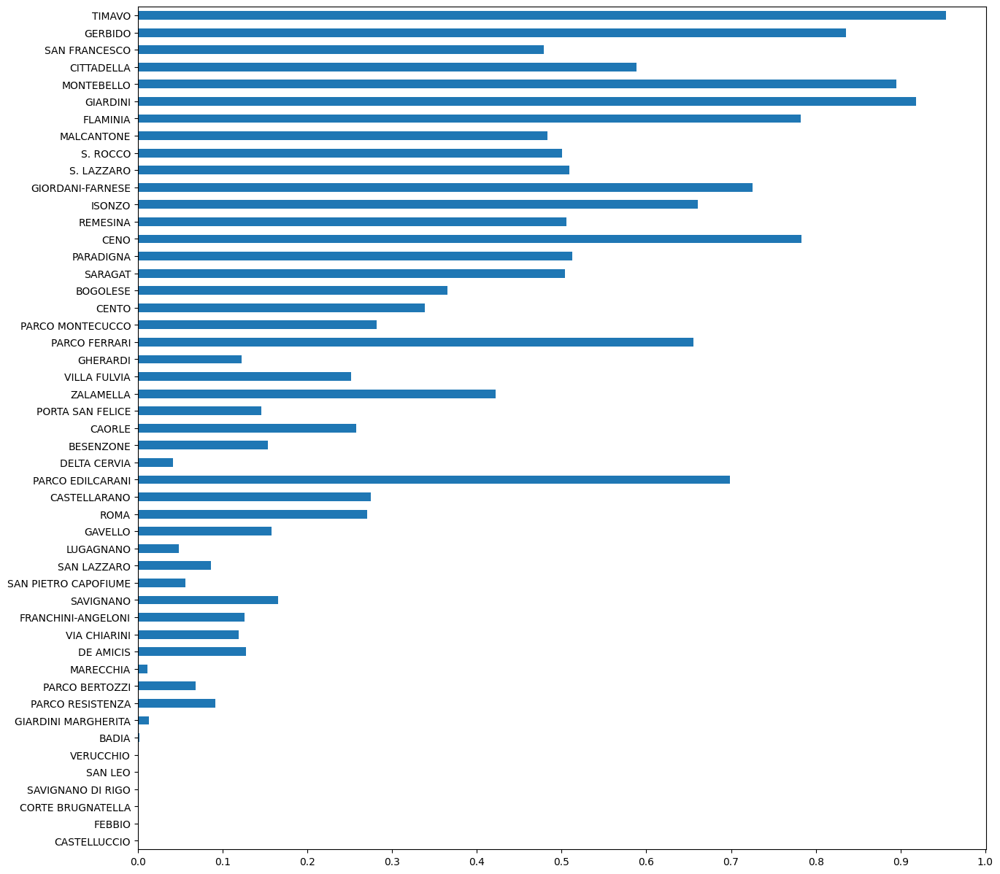

In [26]:
aux_results.loc['mean',:].plot(kind='barh', figsize=(15,15), xticks=np.linspace(0,1,11))
#res = plt.xticks(rotation = 30)

In [27]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.is_over_annual_limit.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,CASTELLUCCIO,PORTA SAN FELICE,ZALAMELLA,VILLA FULVIA,GHERARDI,PARCO FERRARI,PARCO MONTECUCCO,CENTO,BOGOLESE,BESENZONE,SARAGAT,REMESINA,ISONZO,GIORDANI-FARNESE,S. LAZZARO,S. ROCCO,MALCANTONE,CITTADELLA,SAN FRANCESCO,PARADIGNA,DELTA CERVIA,CAORLE,CASTELLARANO,SAN LEO,VERUCCHIO,BADIA,GIARDINI MARGHERITA,PARCO RESISTENZA,PARCO EDILCARANI,PARCO BERTOZZI,MARECCHIA,SAVIGNANO DI RIGO,DE AMICIS,FRANCHINI-ANGELONI,SAVIGNANO,SAN PIETRO CAPOFIUME,SAN LAZZARO,LUGAGNANO,GAVELLO,FEBBIO,ROMA,VIA CHIARINI,CORTE BRUGNATELLA,CENO,FLAMINIA,GIARDINI,MONTEBELLO,GERBIDO,TIMAVO
count,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.0,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000400,0.000400,0.000800,0.00100,0.002200,0.006000
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.019998,0.019998,0.028276,0.03161,0.046857,0.077235
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
max,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000


<AxesSubplot: >

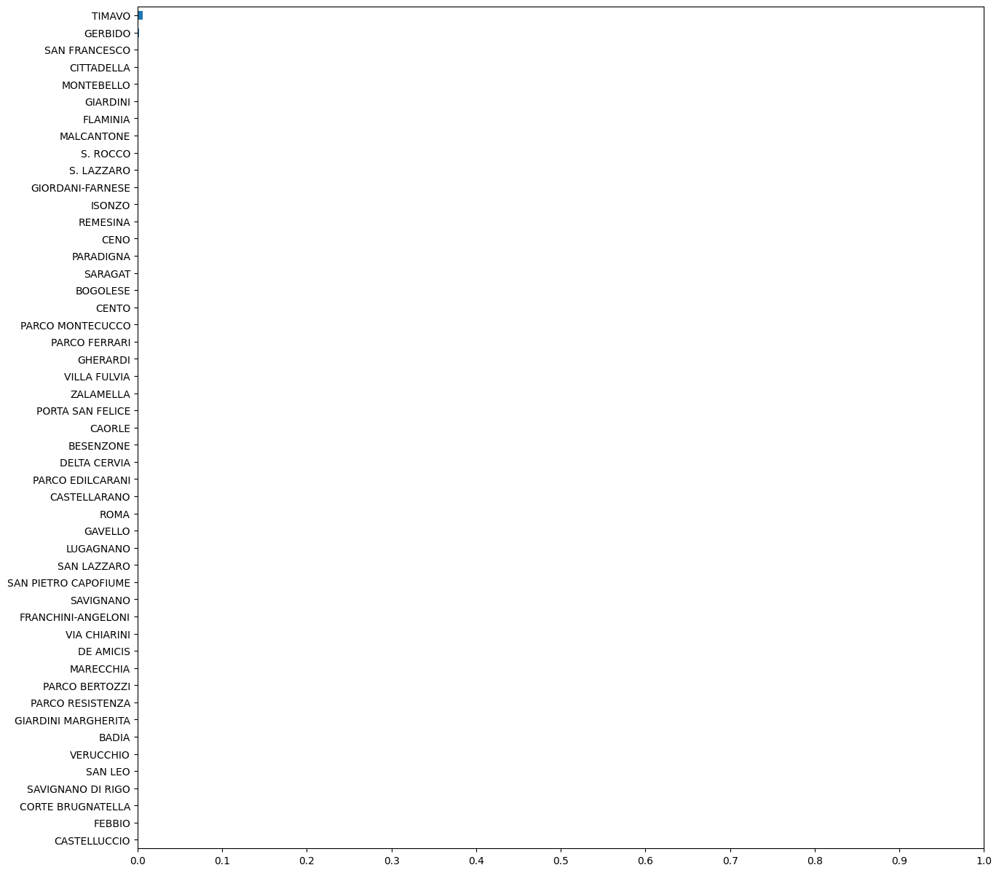

In [28]:
aux_results.loc['mean',:].plot(kind='barh', figsize=(15,15), xticks=np.linspace(0,1,11))
#res = plt.xticks(rotation = 30)

In [29]:
y_post_pred = ritorno['inference_data'].posterior.y_post_pred.to_numpy()
y_post_pred = y_post_pred.reshape(y_post_pred.shape[0]*y_post_pred.shape[1], y_post_pred.shape[2], y_post_pred.shape[3])
y_post_pred.shape

(5000, 365, 49)

In [30]:
import ipywidgets as widgets
from ipywidgets import HBox, VBox
from IPython.display import display

In [31]:
@widgets.interact(stazione = df.columns)
def f(stazione):
    col_map = sns.light_palette((20, 75, 70), input='husl', as_cmap=True)

    plt.figure(figsize=(14,8))
    ax = plt.subplot(1,1,1)

    idx_stazione = df.columns.to_list().index(stazione)
    
    """
    sns.lineplot(np.transpose(y_post_pred[0:50,:,idx_stazione]))
    """

    lower_lim = np.zeros(len(df.index))
    upper_lim = np.zeros(len(df.index))    
    for i in range(len(df.index)):
        lower_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],2.5)
        upper_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],97.5)
    
    
#    sns.lineplot(lower_lim)
#    sns.lineplot(upper_lim)
    
    for i in range(len(df.index)):
        ax.add_patch(mplt.patches.Rectangle((i,lower_lim[i]),1,upper_lim[i]-lower_lim[i], fill=True, color=col_map(180)))

    sns.lineplot(df[stazione])    
    sns.lineplot(np.mean(y_post_pred[:,:,idx_stazione], axis=0))


    index = 0
    for line in ax.get_lines():
        if index == 0:
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(155))
        else:
            col_map = sns.dark_palette((10,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
        index += 1
        
    plt.ylim(bottom=0,top=2.5)

    primo_giorno = datetime.date(2018,1,1)
    date_da_segnare = []
    date_da_segnare_posizioni = []

    for i in range(12):
        date_da_segnare.append(datetime.date(2018,i+1,1))
        date_da_segnare_posizioni.append((date_da_segnare[2*i] - primo_giorno).days)
        date_da_segnare.append(datetime.date(2018,i+1,15))
        date_da_segnare_posizioni.append((date_da_segnare[2*i+1] - primo_giorno).days)
        date_da_segnare[2*i] = date_da_segnare[2*i].isoformat()
        date_da_segnare[2*i+1] = date_da_segnare[2*i+1].isoformat()

    plt.xticks(date_da_segnare_posizioni,date_da_segnare,rotation=65)
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=True,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=True)
    plt.grid()
    
    """
    ax.get_legend().remove()
    col_vals = np.linspace(1,255,num=len(df.columns))
    index = 0
    for line in ax.get_lines():
        if(index == len(ax.get_lines()) - 1):
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            continue
        if(index == len(ax.get_lines()) - 2):
            col_map = sns.dark_palette((120,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            index += 1
            continue

        #line.set_c(col_map(int(np.round(col_vals[index]))))
        line.set_c(col_map(220))
        line.set_alpha(0.3)
        index += 1
    """
    
    

    plt.show()

interactive(children=(Dropdown(description='stazione', options=('CASTELLUCCIO', 'FEBBIO', 'CORTE BRUGNATELLA',…

In [32]:
def f(stazione):
    col_map = sns.light_palette((20, 75, 70), input='husl', as_cmap=True)

    plt.figure(figsize=(14,8))
    ax = plt.subplot(1,1,1)

    idx_stazione = df.columns.to_list().index(stazione)
    
    """
    sns.lineplot(np.transpose(y_post_pred[0:50,:,idx_stazione]))
    """

    lower_lim = np.zeros(len(df.index))
    upper_lim = np.zeros(len(df.index))    
    for i in range(len(df.index)):
        lower_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],2.5)
        upper_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],97.5)
    
    
#    sns.lineplot(lower_lim)
#    sns.lineplot(upper_lim)
    
    for i in range(len(df.index)):
        ax.add_patch(mplt.patches.Rectangle((i,lower_lim[i]),1,upper_lim[i]-lower_lim[i], fill=True, color=col_map(180)))

    sns.lineplot(df[stazione])    
    sns.lineplot(np.mean(y_post_pred[:,:,idx_stazione], axis=0))


    index = 0
    for line in ax.get_lines():
        if index == 0:
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(155))
        else:
            col_map = sns.dark_palette((10,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
        index += 1
        
    plt.ylim(bottom=0,top=2.5)

    primo_giorno = datetime.date(2018,1,1)
    date_da_segnare = []
    date_da_segnare_posizioni = []

    for i in range(12):
        date_da_segnare.append(datetime.date(2018,i+1,1))
        date_da_segnare_posizioni.append((date_da_segnare[2*i] - primo_giorno).days)
        date_da_segnare.append(datetime.date(2018,i+1,15))
        date_da_segnare_posizioni.append((date_da_segnare[2*i+1] - primo_giorno).days)
        date_da_segnare[2*i] = date_da_segnare[2*i].isoformat()
        date_da_segnare[2*i+1] = date_da_segnare[2*i+1].isoformat()

    plt.xticks(date_da_segnare_posizioni,date_da_segnare,rotation=65)
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=True,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=True)
    plt.grid()
    
    """
    ax.get_legend().remove()
    col_vals = np.linspace(1,255,num=len(df.columns))
    index = 0
    for line in ax.get_lines():
        if(index == len(ax.get_lines()) - 1):
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            continue
        if(index == len(ax.get_lines()) - 2):
            col_map = sns.dark_palette((120,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            index += 1
            continue

        #line.set_c(col_map(int(np.round(col_vals[index]))))
        line.set_c(col_map(220))
        line.set_alpha(0.3)
        index += 1
    """
    
    

    plt.show()

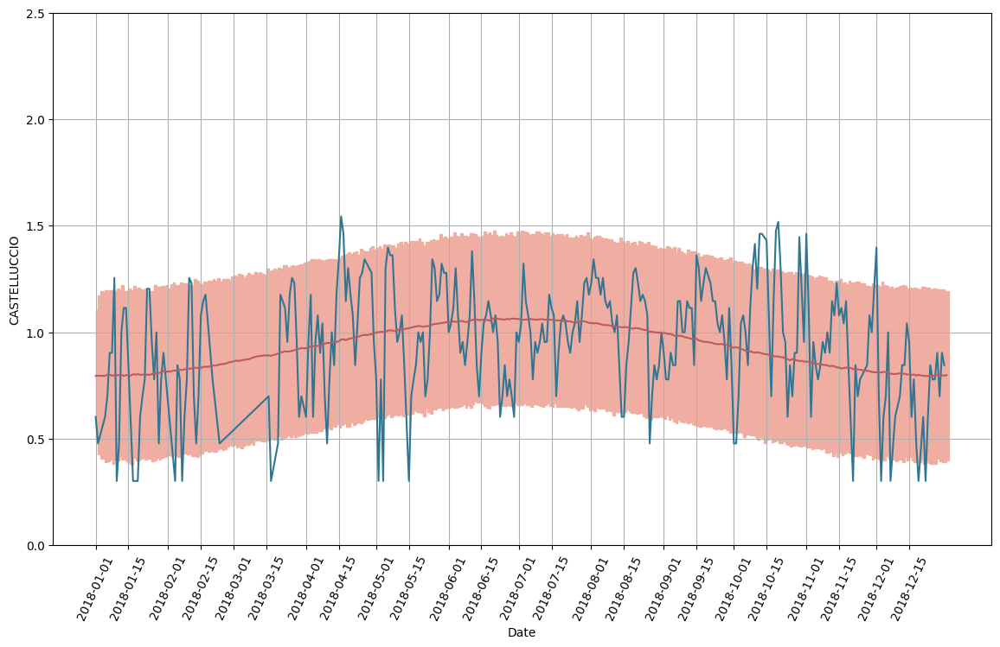

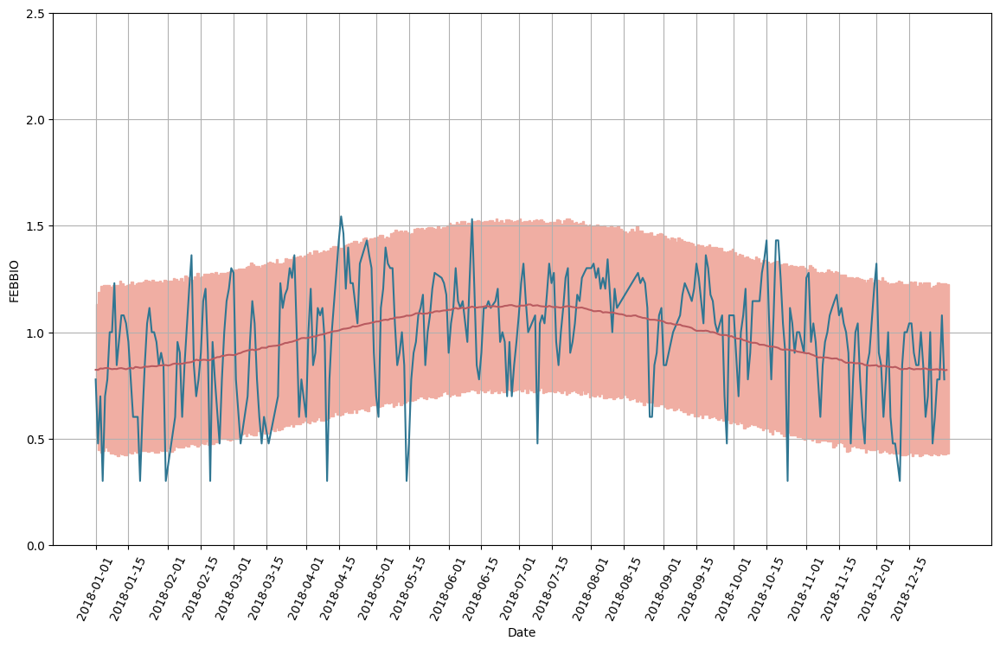

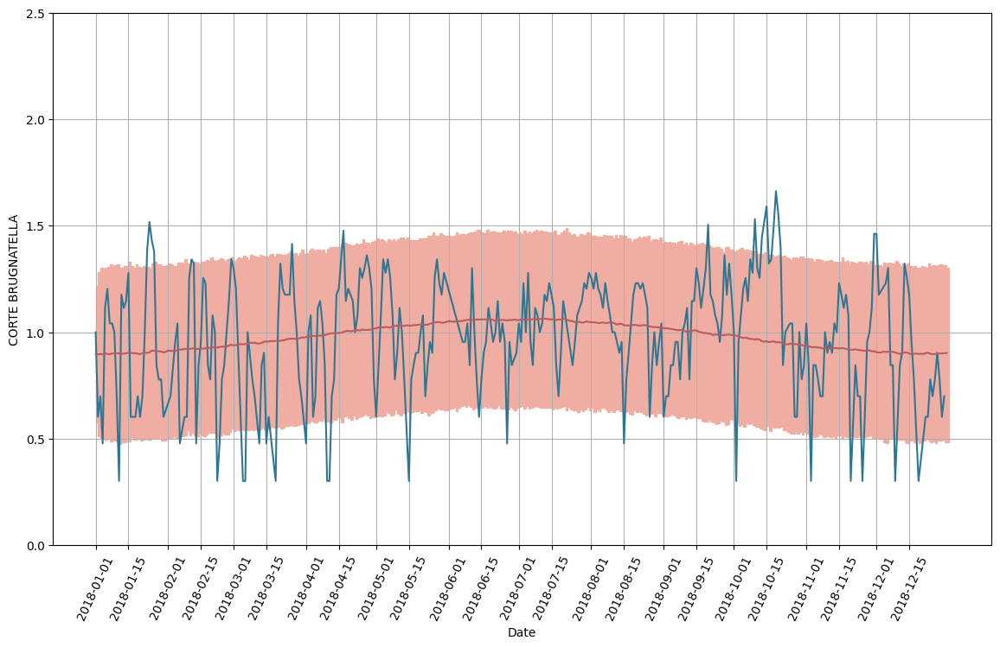

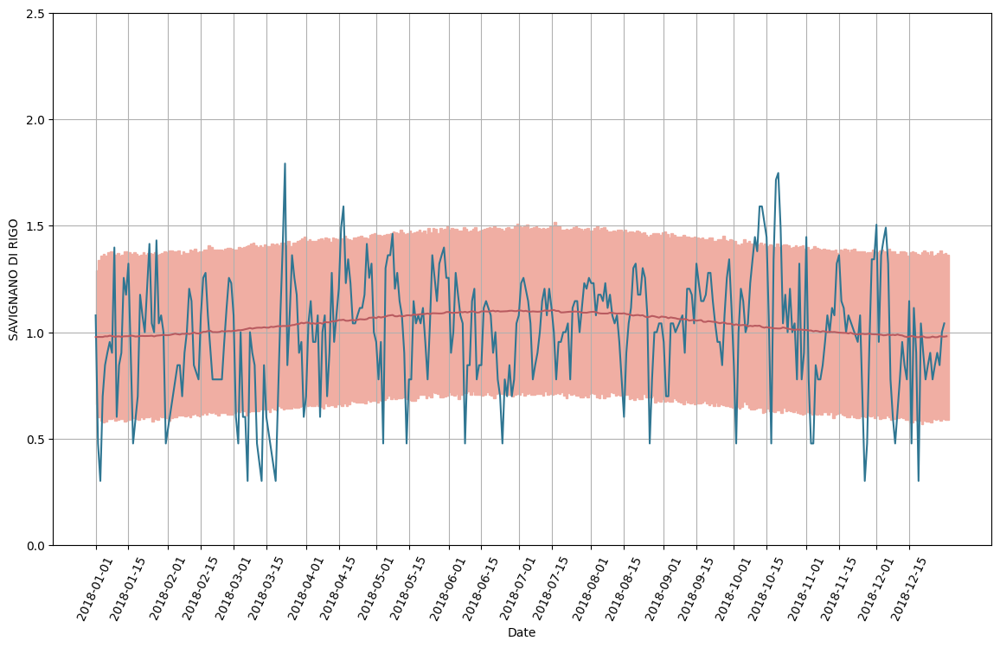

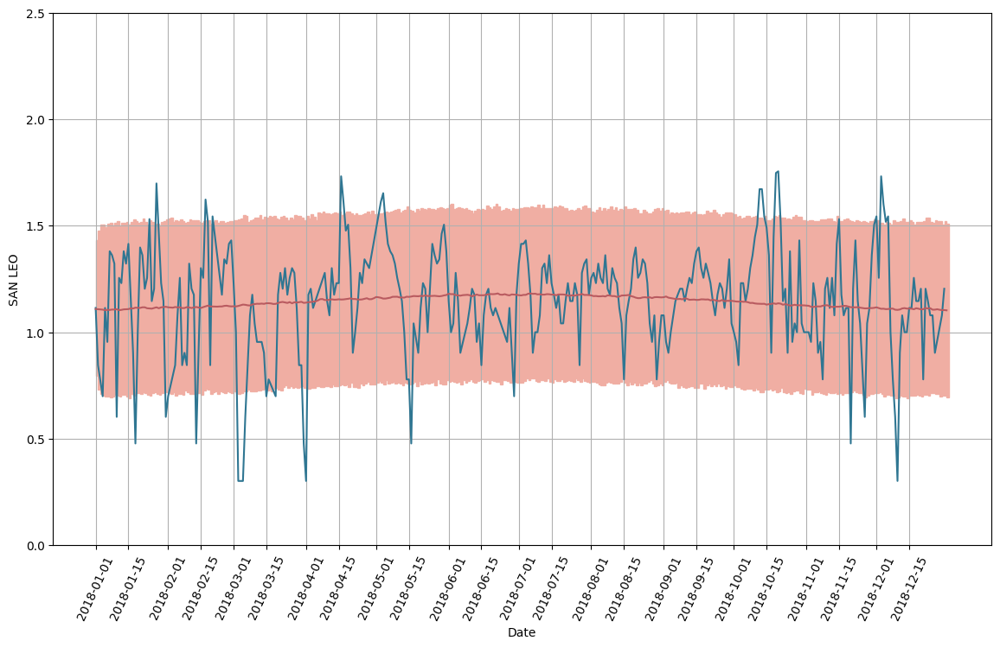

...

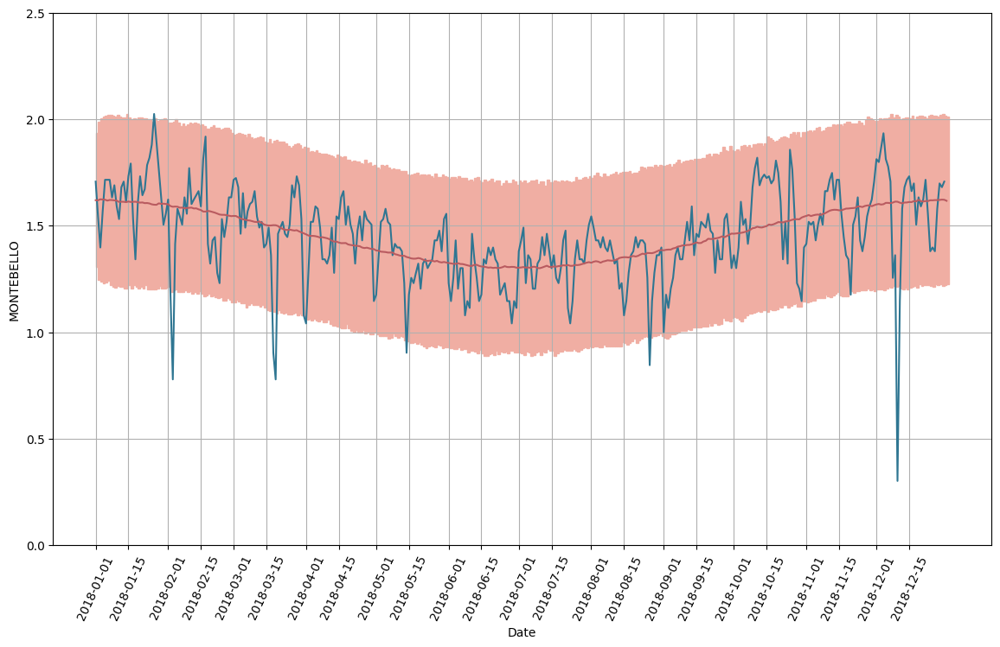

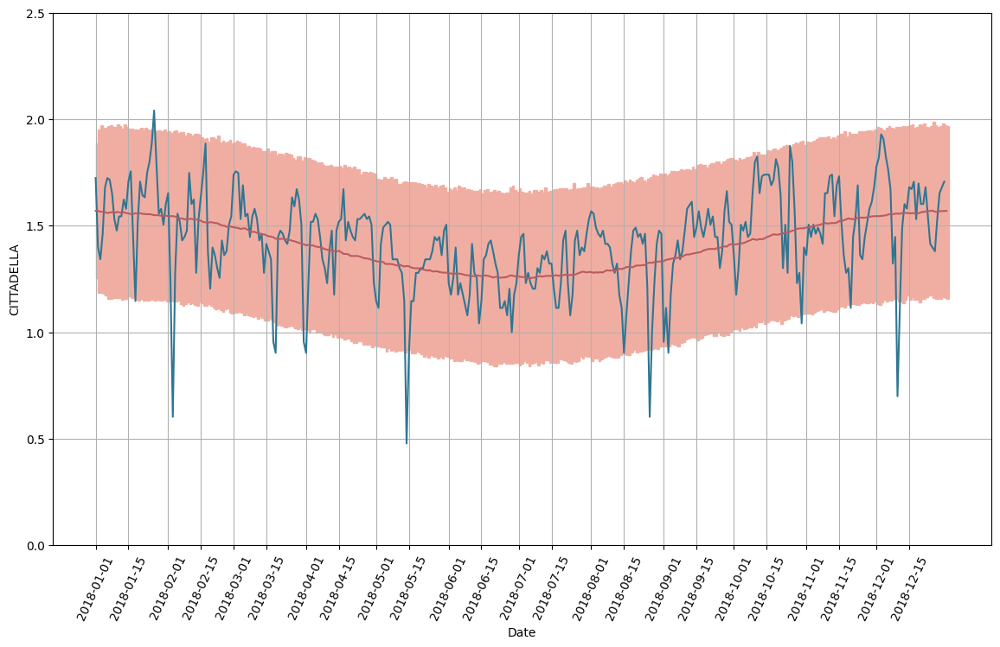

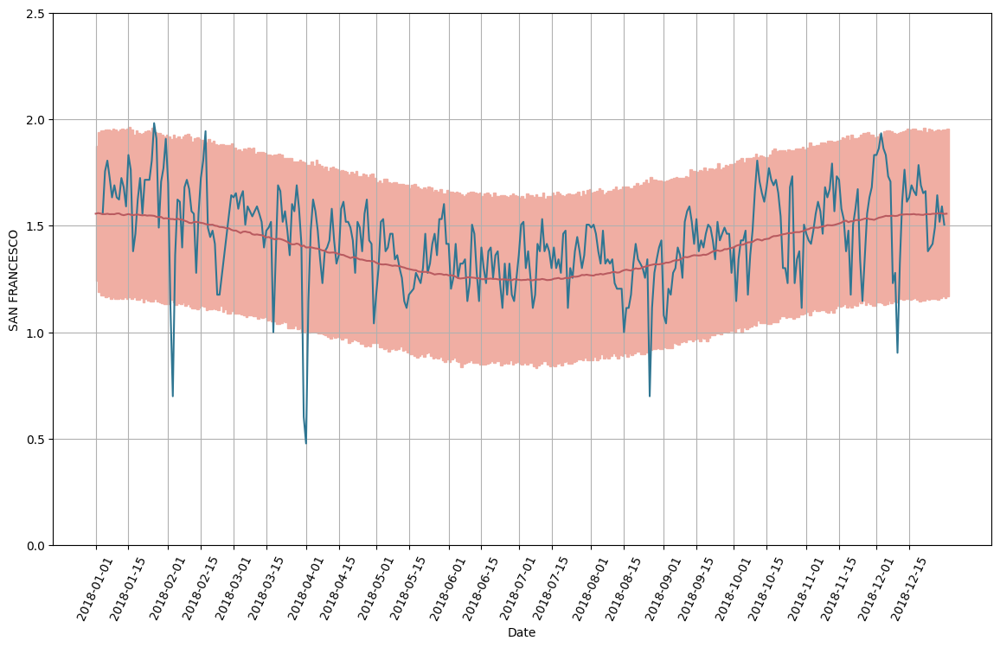

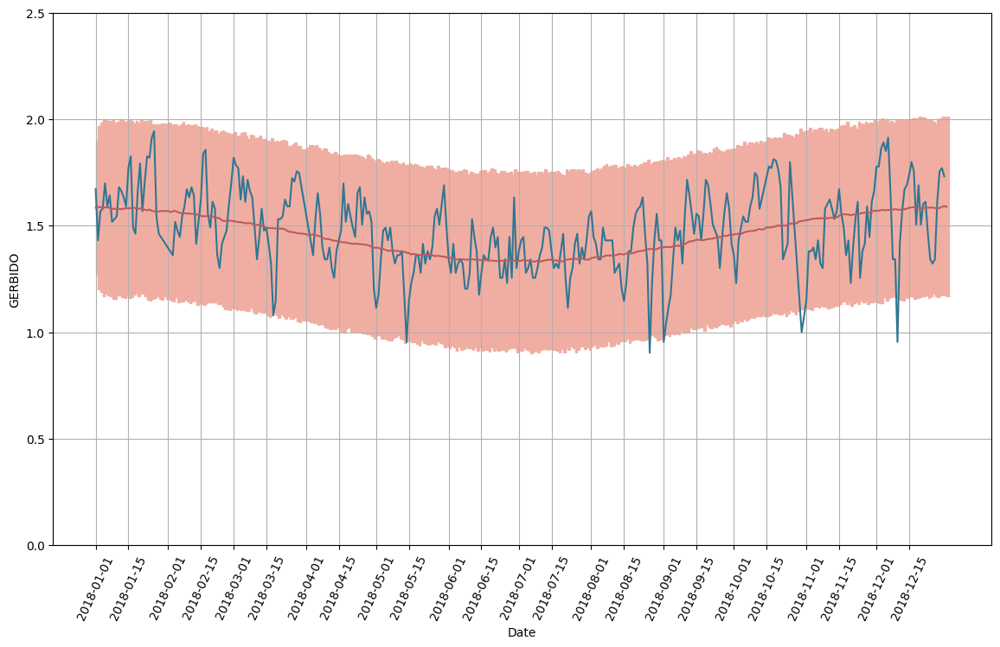

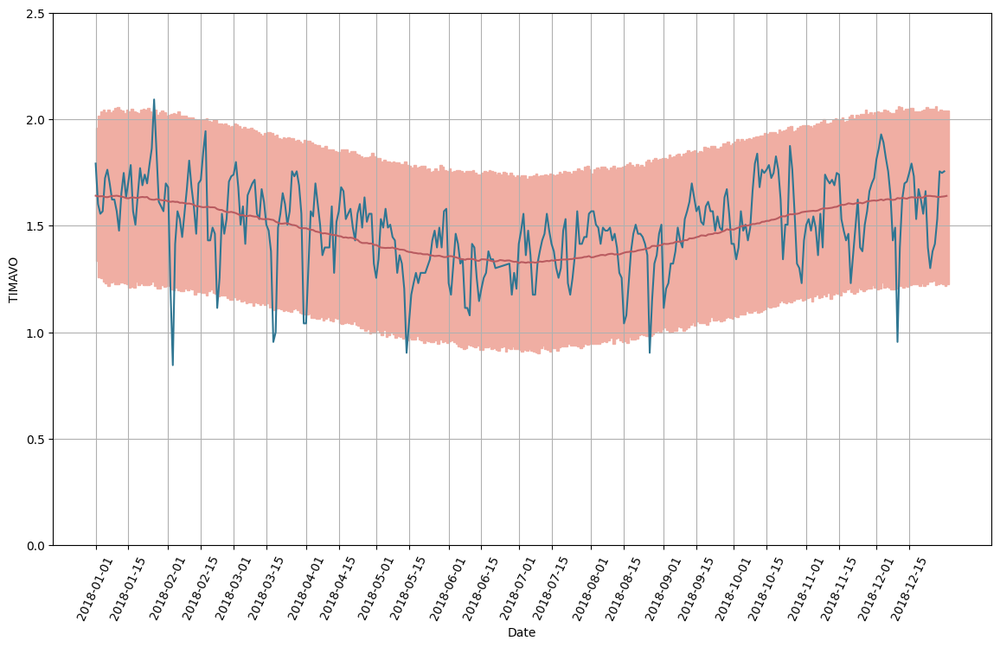

In [33]:
for stazione in df.columns:
    f(stazione)